In [1]:
#importing necessary libraries
import pandas as pd
import numpy as np
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import math
pd.set_option('display.max_rows', 300)

In [2]:
#loading csv
df1=pd.read_csv('query (5).csv')

In [3]:
#dataframe
df1.shape

(14118, 22)

In [4]:
#checking the variance in my magnitude column
listA= df1['mag'] 
np.var(listA)

0.28067086505275973

In [5]:
listA.std()

0.5298025545587228

In [6]:
#EDA on magnitude of earthquakes
df1['mag'].value_counts()

1.12    171
1.10    158
1.13    152
1.08    149
1.18    147
       ... 
0.08      1
4.10      1
3.95      1
3.84      1
3.40      1
Name: mag, Length: 359, dtype: int64

In [7]:
#converting my time series from string to datetime
df1['time2']=[ele.replace('T', ' ') for ele in df1['time']]

In [8]:
#function converting string into datetime
def datetime(data):
    a=[]
    for i in range(14118):
        a.append(df1.time2[i][0:19])
    return a
        


In [9]:
#new variable containing my converted datetime
a=datetime(df1['time2'])

In [10]:
#passing the variable into my dataframe in a new column
df1['time3']=a

In [11]:
#examination to see cleaned data
df1['time3'].head(50)

0     2020-08-03 06:44:17
1     2020-08-02 12:40:24
2     2020-07-31 19:45:52
3     2020-07-30 02:57:49
4     2020-07-30 02:51:28
5     2020-07-30 02:40:31
6     2020-07-30 00:40:41
7     2020-07-29 09:40:34
8     2020-07-29 03:08:48
9     2020-07-28 23:41:12
10    2020-07-28 22:24:57
11    2020-07-28 21:44:28
12    2020-07-28 19:21:27
13    2020-07-28 18:30:29
14    2020-07-28 18:13:52
15    2020-07-27 22:00:26
16    2020-07-27 10:06:59
17    2020-07-27 08:13:04
18    2020-07-27 07:27:48
19    2020-07-27 03:28:06
20    2020-07-27 00:14:18
21    2020-07-26 22:00:21
22    2020-07-26 19:32:58
23    2020-07-26 08:16:34
24    2020-07-26 06:53:28
25    2020-07-25 16:31:15
26    2020-07-25 13:03:30
27    2020-07-25 05:31:35
28    2020-07-24 13:09:59
29    2020-07-24 09:54:38
30    2020-07-24 08:37:32
31    2020-07-24 04:26:37
32    2020-07-22 21:55:28
33    2020-07-22 11:54:47
34    2020-07-22 01:00:45
35    2020-07-21 18:30:35
36    2020-07-21 12:18:23
37    2020-07-21 01:26:33
38    2020-0

In [12]:
#realized my data is backwards present to past rather than past to present so I will groupby 
#and pass agg function to get the df into the preferred order
results=df1.groupby('time3').mean()

In [13]:
#seismic 'noise' ===> The Global Variance metric used to compare my data
results['no_noise_mag']= abs(results['mag']-results['mag'].mean())
np.var(results['no_noise_mag'])

0.11835829135416677

In [14]:
results.reset_index()

,time3,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst,no_noise_mag
0,2010-01-01 02:27:46,38.263833,-122.188167,12.705,1.62,34.0,99.0,0.027030,0.21,0.38,0.80,0.172,30.0,0.311086
1,2010-01-01 05:25:27,37.360000,-121.724000,5.670,1.00,23.0,37.0,0.037840,0.06,0.19,0.50,0.186,23.0,0.308914
2,2010-01-01 10:06:09,37.548167,-121.782167,5.451,0.92,10.0,97.0,0.076580,0.02,0.29,0.82,0.133,11.0,0.388914
3,2010-01-01 14:59:15,37.389000,-121.741000,8.260,0.83,16.0,75.0,0.027030,0.04,0.24,0.54,0.249,16.0,0.478914
4,2010-01-01 20:13:06,38.256167,-122.189333,10.272,1.18,13.0,109.0,0.032430,0.09,0.44,0.65,0.171,12.0,0.128914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14111,2020-07-30 02:51:28,37.547167,-121.932500,5.540,1.19,32.0,61.0,0.007144,0.09,0.22,0.16,0.209,22.0,0.118914
14112,2020-07-30 02:57:49,37.485167,-121.800667,8.060,1.01,24.0,72.0,0.034760,0.05,0.23,0.40,0.184,21.0,0.298914
14113,2020-07-31 19:45:52,38.124500,-122.182000,-0.020,1.40,16.0,80.0,0.025910,0.13,0.31,31.61,0.403,15.0,0.091086
14114,2020-08-02 12:40:24,37.408000,-121.755000,8.970,2.96,140.0,29.0,0.036750,0.08,0.08,0.19,0.174,65.0,1.651086


In [15]:
t= results[results['mag']<4.0]

### All quakes between 4 and 3 in my data (100 in total). These are quakes that can be felt but only if one is quiet and still

In [16]:
s=t[t['mag']>=3.0]
s.reset_index()

,time3,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst,no_noise_mag
0,2010-01-08 19:48:50,37.482167,-121.793000,9.373,3.73,179.0,37.0,0.032430,0.15,0.14,0.33,NaN,3.0,2.421086
1,2010-03-03 20:36:33,37.417833,-121.761167,9.618,3.37,172.0,31.0,0.045050,0.15,0.12,0.29,NaN,3.0,2.061086
2,2010-03-28 06:56:32,37.478833,-121.798833,9.786,3.22,206.0,28.0,0.028830,0.17,0.13,0.34,0.171,61.0,1.911086
3,2010-05-15 17:54:42,37.700667,-122.003000,9.892,3.28,218.0,32.0,0.048650,0.16,0.11,0.17,NaN,4.0,1.971086
4,2010-05-30 06:59:57,37.718333,-122.119500,5.315,3.20,219.0,16.0,0.005405,0.17,0.09,0.14,NaN,6.0,1.891086
5,2010-06-28 14:47:04,37.742167,-122.552333,7.655,3.25,164.0,99.0,0.042340,0.09,0.11,0.16,NaN,6.0,1.941086
6,2010-07-23 21:29:10,37.665000,-122.512333,7.597,3.15,127.0,101.0,0.027030,0.10,0.16,0.20,NaN,3.0,1.841086
7,2010-09-02 16:35:33,37.961667,-122.347333,5.146,3.12,194.0,17.0,0.028830,0.18,0.10,0.20,NaN,3.0,1.811086
8,2010-10-05 13:28:23,37.398167,-121.510167,7.390,3.07,182.0,40.0,0.053150,0.13,0.11,0.28,NaN,4.0,1.761086
9,2010-10-15 16:13:53,37.410000,-121.752667,9.161,3.00,213.0,22.0,0.039640,0.13,0.09,0.20,NaN,3.0,1.691086


In [17]:
s.shape

(100, 13)

In [18]:
v=t[t['mag']>2.0]

### All quakes between 3 and 2 in my data (1423 in total)

In [19]:
v[v['mag']<3.0]

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst,no_noise_mag
time3,,,,,,,,,,,,,
2010-01-02 08:30:55,37.765000,-122.565000,11.551,2.24,84.0,96.0,0.047750,0.07,0.23,0.30,0.183,52.0,0.931086
2010-01-06 16:04:39,37.878500,-122.259000,9.196,2.07,85.0,43.0,0.005405,0.14,0.15,0.25,0.161,56.0,0.761086
2010-01-07 07:09:00,37.409500,-121.755000,8.968,2.95,127.0,32.0,0.038740,0.10,0.12,0.31,0.165,43.0,1.641086
2010-01-07 18:36:46,37.475000,-121.798667,7.696,2.21,96.0,64.0,0.024320,0.07,0.10,0.25,0.125,92.0,0.901086
2010-01-07 18:54:42,37.475833,-121.794833,7.966,2.24,98.0,36.0,0.026130,0.07,0.10,0.31,0.143,94.0,0.931086
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-26 06:53:28,37.481833,-121.803500,8.630,2.63,116.0,34.0,0.031530,0.09,0.10,0.19,0.165,134.0,1.321086
2020-07-27 03:28:06,38.157500,-122.293000,6.520,2.04,60.0,38.0,0.037980,0.15,0.19,0.41,0.176,47.0,0.731086
2020-07-27 07:27:48,37.831667,-121.770833,14.060,2.54,84.0,94.0,0.097350,0.12,0.21,0.37,0.142,84.0,1.231086


In [20]:
v.mag.value_counts()

2.04    39
2.02    39
2.03    35
2.06    35
2.09    33
2.01    32
2.21    32
2.22    28
2.08    27
2.11    27
2.14    27
2.05    25
2.19    24
2.10    24
2.07    23
2.13    22
2.17    22
2.20    22
2.24    21
2.16    21
2.26    21
2.27    20
2.34    20
2.23    19
2.15    19
2.12    18
2.18    18
2.36    18
2.37    18
2.35    17
2.43    17
2.42    17
2.32    16
2.28    16
2.25    15
2.30    14
2.39    14
2.55    14
2.47    14
2.49    13
2.46    13
2.63    13
2.72    13
2.50    13
2.29    13
2.51    12
2.48    12
2.61    12
2.33    12
2.40    12
2.45    12
2.31    11
2.52    11
2.54    11
2.38    10
2.41    10
2.60    10
2.44    10
2.70     9
2.62     9
2.92     9
2.80     9
2.89     9
2.68     9
2.76     8
2.69     8
2.79     8
2.65     8
2.53     8
2.64     8
2.74     8
2.58     8
2.90     7
2.83     7
2.82     7
2.56     7
2.67     7
2.95     7
2.78     6
2.99     6
3.28     6
2.86     6
2.59     6
2.66     6
3.25     5
2.91     5
2.85     5
2.84     5
2.93     5
2.57     5
3.37     4

### All quakes below 2.0 in data (12618 in total)

In [21]:
t[t['mag']<2]

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst,no_noise_mag
time3,,,,,,,,,,,,,
2010-01-01 02:27:46,38.263833,-122.188167,12.705,1.62,34.0,99.0,0.027030,0.21,0.38,0.80,0.172,30.0,0.311086
2010-01-01 05:25:27,37.360000,-121.724000,5.670,1.00,23.0,37.0,0.037840,0.06,0.19,0.50,0.186,23.0,0.308914
2010-01-01 10:06:09,37.548167,-121.782167,5.451,0.92,10.0,97.0,0.076580,0.02,0.29,0.82,0.133,11.0,0.388914
2010-01-01 14:59:15,37.389000,-121.741000,8.260,0.83,16.0,75.0,0.027030,0.04,0.24,0.54,0.249,16.0,0.478914
2010-01-01 20:13:06,38.256167,-122.189333,10.272,1.18,13.0,109.0,0.032430,0.09,0.44,0.65,0.171,12.0,0.128914
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-30 02:40:31,37.607667,-122.444000,8.040,0.85,11.0,75.0,0.031710,0.06,0.38,0.69,0.382,10.0,0.458914
2020-07-30 02:51:28,37.547167,-121.932500,5.540,1.19,32.0,61.0,0.007144,0.09,0.22,0.16,0.209,22.0,0.118914
2020-07-30 02:57:49,37.485167,-121.800667,8.060,1.01,24.0,72.0,0.034760,0.05,0.23,0.40,0.184,21.0,0.298914


# Finding quakes above 4.0

In [22]:
#wanted to study quakes 4.0 and above. There are 8 of them this decade.
results[results['mag']>=4.0]

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst,no_noise_mag
time3,,,,,,,,,,,,,
2010-01-07 18:09:35,37.481167,-121.798667,10.753,4.05,201.0,36.0,0.030630,0.17,0.14,0.34,NaN,4.0,2.741086
2011-01-08 00:10:16,37.287167,-121.658167,9.593,4.10,244.0,55.0,0.030630,0.18,0.14,0.37,NaN,10.0,2.791086
2014-08-24 10:20:44,38.215167,-122.312333,11.120,6.02,369.0,28.0,0.036040,0.18,0.11,0.15,NaN,0.0,4.711086
2015-05-22 02:53:00,38.431667,-122.250333,12.830,4.09,172.0,90.0,0.008108,0.19,0.17,0.23,NaN,5.0,2.781086
2015-08-17 13:49:17,37.836667,-122.232167,4.690,4.01,270.0,12.0,0.011710,0.15,0.08,0.11,NaN,9.0,2.701086
2017-10-10 00:53:18,37.313500,-121.672000,9.690,4.09,243.0,23.0,0.036600,0.16,0.10,0.20,NaN,6.0,2.781086
2018-01-04 10:39:37,37.855167,-122.256833,12.310,4.38,289.0,13.0,0.004662,0.18,0.11,0.20,NaN,7.0,3.071086
2019-07-16 20:11:01,37.818667,-121.756833,12.380,4.31,136.0,75.0,0.037260,0.14,0.17,0.29,NaN,4.0,3.001086
2019-10-15 05:33:42,37.938000,-122.057000,13.970,4.46,148.0,22.0,0.020500,0.10,0.10,0.18,NaN,4.0,3.151086


# Analyzing 6.0 quakes

In [23]:
#Largest earthquake of decade in the SF region 6.1 rated. Wanted to study seismic activity 2 weeks
#before earthquake to find patterns. I see that magnitude of precursor quakes were very small and 
#had little variance, my hypothesis soon followed.
Napa_eq=df1[7896:8297]
Napa_eq.groupby('time3').mean().tail(60).reset_index()


,time3,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
0,2014-08-05 12:40:01,38.255667,-122.323167,8.107,3.03,170.0,23.0,0.038740,0.15,0.09,0.22,NaN,3
1,2014-08-05 14:03:03,37.399000,-121.737333,4.835,0.76,15.0,81.0,0.036040,0.06,0.24,0.46,0.195,15
2,2014-08-06 01:16:35,38.117167,-122.176667,-0.059,0.98,12.0,99.0,0.022520,0.05,0.25,31.61,0.221,6
3,2014-08-06 02:14:42,37.887333,-122.037333,10.311,0.82,18.0,117.0,0.045050,0.04,0.32,0.47,0.156,16
4,2014-08-06 20:08:14,37.798667,-122.036000,6.556,1.54,27.0,97.0,0.027930,0.06,0.17,0.37,0.162,27
5,2014-08-06 20:20:17,37.328833,-122.098833,-0.328,1.34,14.0,87.0,0.079280,0.02,0.45,31.61,0.159,12
6,2014-08-06 23:36:48,38.462500,-122.648833,5.587,1.42,16.0,51.0,0.048650,0.08,0.22,0.76,0.171,16
7,2014-08-07 01:08:42,37.295333,-121.671833,5.087,1.18,18.0,61.0,0.036040,0.05,0.23,0.35,0.115,17
8,2014-08-07 14:14:34,37.584333,-121.979167,8.124,1.07,16.0,64.0,0.026130,0.08,0.30,0.37,0.135,14
9,2014-08-07 15:05:24,37.595167,-122.431500,4.959,0.70,7.0,88.0,0.054050,0.05,0.69,2.18,0.437,5


In [24]:
#observed variance of magnitude in the two weeks before Napa earthquake
np.var(df1['mag'][7896:8297])

0.28486846474835387

In [25]:
np.var(results['mag'][8167:8197])

0.22134988888888887

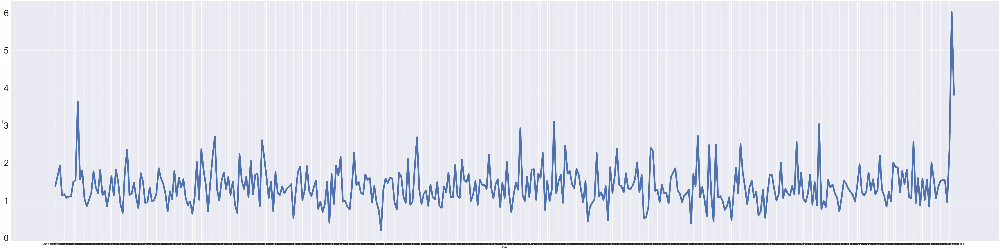

In [26]:
#plot of the data from 3 months before
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
sns.lineplot(x= df1['time3'][7895:8296], y=df1['mag'][7895:8296], linewidth=9.5)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
plt.savefig('Napaquake.png')

# Analyzing 4.0 quakes 

### Analysis of Quake A 

In [27]:
#studied earthquakes that were 4.0 or greater
quakeA=results[12847:13147]

quakeA.reset_index(inplace=True)

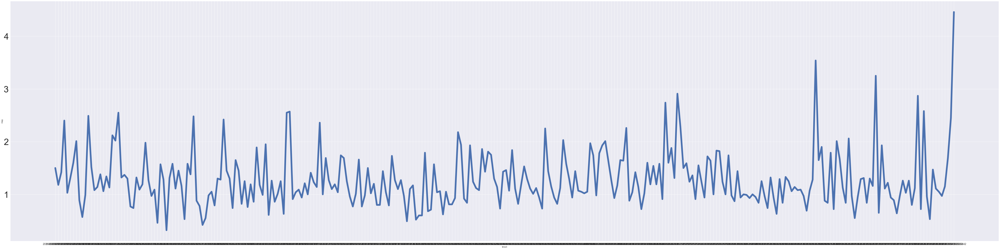

In [28]:
fig= plt.figure(figsize=(100,25))

sns.set(style='darkgrid')
sns.lineplot(x=quakeA.time3, y=quakeA.mag, linewidth=9.5)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
plt.savefig('quakeA.png')

In [29]:
#variance of the data leading up to earthquake
np.var(results['mag'][12847:13147])

0.2844367500000001

In [30]:
np.var(results.mag[13116:13146])

0.4325445555555556

### Analysis of Quake B

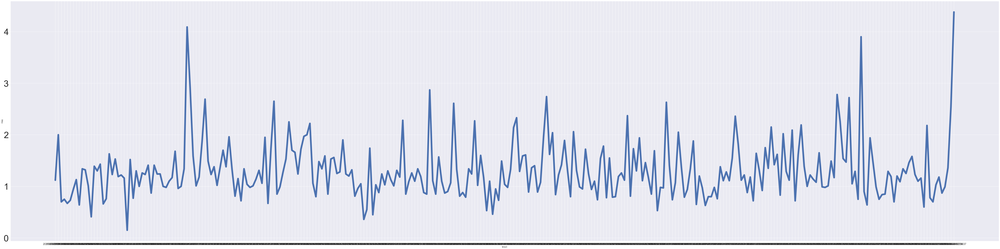

In [31]:
#plot of another 4.0 earthquake
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
quakeb=results[10809:11110]
quakeb.reset_index(inplace=True)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
sns.lineplot(x= quakeb['time3'], y = quakeb['mag'], linewidth=9.5)
plt.savefig('quakeB.png')

In [32]:
#variance of data leading up to earthquake
np.var(results['mag'][10809:11110])


0.31459500005518704

In [33]:
np.var(results['mag'][11080:11110])

0.5189823333333333

### Analysis of Quake C

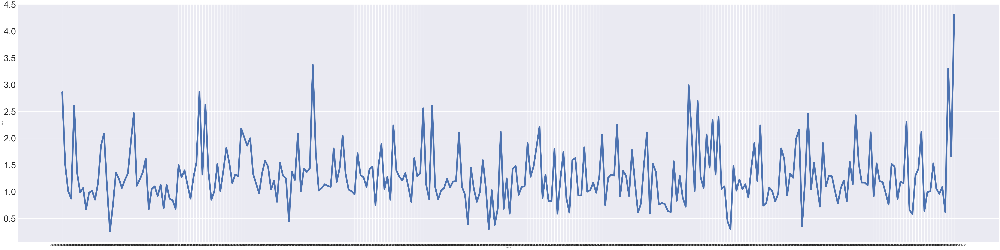

In [34]:
#graph of another quake that was 4.0
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
quakec=results[12458:12758]
quakec.reset_index(inplace=True)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
sns.lineplot(x= quakec['time3'], y = quakec['mag'], linewidth=9.5)
plt.savefig('quakeC.png')

In [35]:
#variance of data leading up to quake
np.var(results['mag'][12458:12758])


0.3008476266666666

In [36]:
#variance of data 2 weeks before quake
np.var(results['mag'][12728:12758])

0.6190515555555555

### Analysis of Quake D

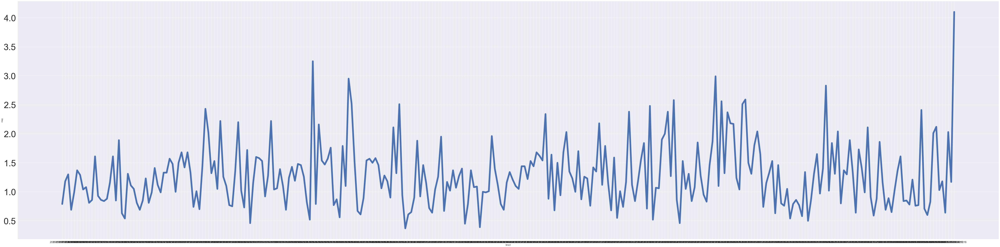

In [37]:
#graph of another quake 4.0 
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
quaked=results[1368:1668]
quaked.reset_index(inplace=True)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
sns.lineplot(x= quaked['time3'], y = quaked['mag'], linewidth=9.5)
plt.savefig('quakeD.png')

In [38]:
#variance of data leading up to quake (2 months)
np.var(results['mag'][1368:1668])

0.3007555766666668

In [39]:
#variance of data 2 weeks before quake
np.var(results['mag'][1638:1668])

0.5519223333333332

### Analysis of Quake E

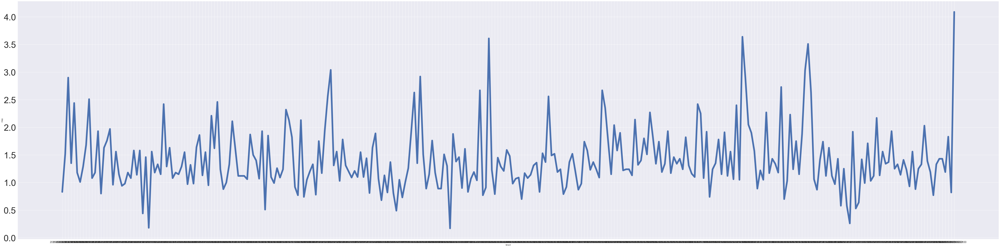

In [40]:
#graph of more 4.0 quakes 8 in total.
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
quakee=results[7123:7423]
quakee.reset_index(inplace=True)
plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
sns.lineplot(x= quakee['time3'], y = quakee['mag'], linewidth=9.5)
plt.savefig('quakeE.png')

In [41]:
#variance of data a month before quake
np.var(results['mag'][7123:7423])

0.32476164888888914

In [42]:
#variance of data 2 weeks before quake
np.var(results['mag'][7123:7153])

0.3281765555555556

### Analysis of Quake F

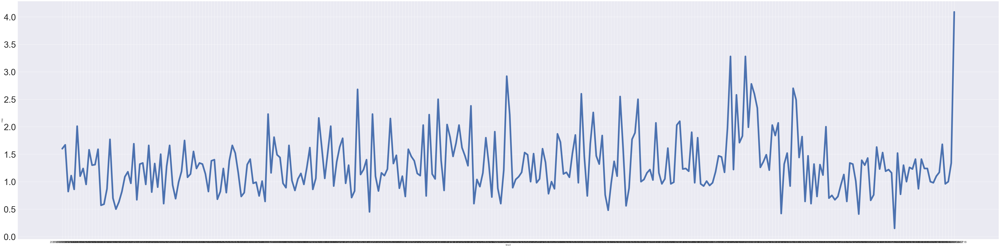

In [43]:
#plot of quake that was 4.0 or higher
fig= plt.figure(figsize=(100,25))
sns.set(style='darkgrid')
quakef=results[10554:10854]
quakef.reset_index(inplace=True)

plt.xticks(rotation=0)
plt.xticks(fontsize=15)
plt.yticks(fontsize=50)
plt.xticks(np.arange(0, len(quakef['time3'])))
sns.lineplot(x= quakef['time3'], y = quakef['mag'], linewidth=9.5)
plt.savefig('quakeF.png')

In [44]:
#variance of data leading up to earthquake
np.var(results['mag'][10554:10854])

0.28706138999999997

In [45]:
#variance of data 2 weeks before quake
np.var(results['mag'][10824:10854])

0.37334899999999993

In [46]:
#new column for datetime
df1['time3']= pd.to_datetime(df1['time3']) 

In [47]:
df1['mag']=df1['mag'].round(4)

In [48]:
#graph of data for the decade
fig= plt.figure(figsize=(50,25))
sns.set(style='darkgrid')
sns.lineplot(results['time3'][0:5000],results['mag'][0:5000], linewidth=4.5)
plt.yticks(np.arange(0, 8, step=1.0))
plt.xticks(rotation=90)
plt.show()

KeyError: 'time3'

<Figure size 3600x1800 with 0 Axes>

## Dickey-Fuller Test for stationarity

In [49]:
#Dickey_Fuller Test
from statsmodels.tsa.stattools import adfuller

In [50]:
#Dickey_Fuller Test
adf_test = adfuller(results['mag'])

In [51]:
#test results which reject H0 hypothesis and we have stationarity.
print ("ADF = " + str(adf_test[0]))
print ("p-value = " +str(adf_test[1]))

ADF = -21.463834004081065
p-value = 0.0


In [52]:
#create train/test datasets
work_results=results[12794:]
X = work_results

train_data = X.mag[:1058]
test_data = X.mag[1058:]

## AR Model

In [60]:
#importing auto_regressive model
from statsmodels.tsa.ar_AutoReg import AutoReg
from sklearn.metrics import r2_score

#train the autoregression model
model = AR(train_data)
model_fit = model.fit()

# print('The lag value chose is: %s' % model_fitted.k_ar)

ModuleNotFoundError: No module named 'statsmodels.tsa.ar_AutoReg'

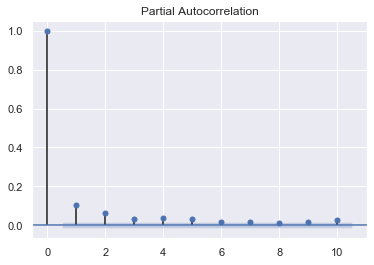

In [54]:
# import the plotting functions for acf and pacf  
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_pacf(results['mag'], lags=10);

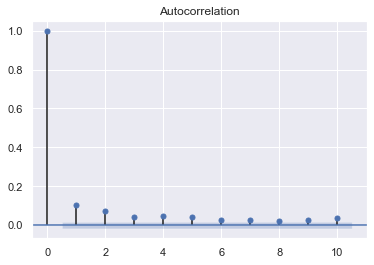

In [55]:
plot_acf(results['mag'], lags=10);

In [56]:
# make predictions 
predictions = model_fit.predict(
    start=len(train_data), 
    end=len(train_data) + len(test_data)-1, 
    dynamic=False)


# create a comparison dataframe
compare_df = pd.concat(
    [results['mag'].reset_index().tail(12),
    predictions], axis=1).rename(
    columns={'mag': 'actual', 0:'predicted'})
compare_df=compare_df[['actual', 'predicted']].dropna()

/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


In [57]:
r2 = r2_score(compare_df.actual, compare_df.predicted)

ValueError: Found array with 0 sample(s) (shape=(0,)) while a minimum of 1 is required.

In [58]:
compare_df.plot()

TypeError: no numeric data to plot

In [59]:
compare_df = pd.concat(
    [df1['mag'].reset_index().tail(12),
    predictions], axis=1).rename(
    columns={'mag': 'actual', 0:'predicted'})
compare_df=compare_df[['actual', 'predicted']].dropna()

## ARIMA model 

### after much trial and error I decided to truncate my training data to 1058 obs. because it allowed for better forecasting. In the previous tries with my full 10 year dataset, the model would predict the mean/median. 

In [61]:

work_results.mag

time3
2019-07-31 17:54:33    1.30
2019-08-01 01:24:16    2.22
2019-08-01 13:28:31    1.10
2019-08-01 23:08:34    0.82
2019-08-02 05:47:56    0.75
                       ... 
2020-07-30 02:51:28    1.19
2020-07-30 02:57:49    1.01
2020-07-31 19:45:52    1.40
2020-08-02 12:40:24    2.96
2020-08-03 06:44:17    0.89
Name: mag, Length: 1322, dtype: float64

In [62]:
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api 
from statsmodels.tsa.stattools import acf

# Create Training and Test
train = work_results.mag[:1058]
test = work_results.mag[1058:]


In [63]:
model = ARIMA(train, order=(5,0,5))
model_fit = model.fit(disp=0)
print(model_fit.summary())

/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:218: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                              ARMA Model Results                              
Dep. Variable:                    mag   No. Observations:                 1058
Model:                     ARMA(5, 5)   Log Likelihood                -721.921
Method:                       css-mle   S.D. of innovations              0.477
Date:                Mon, 10 Aug 2020   AIC                           1467.842
Time:                        07:56:59   BIC                           1527.411
Sample:                             0   HQIC                          1490.420
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2517      0.017     73.637      0.000       1.218       1.285
ar.L1.mag      0.6227      0.417      1.493      0.135      -0.195       1.440
ar.L2.mag      1.0610      0.158      6.725      0.0

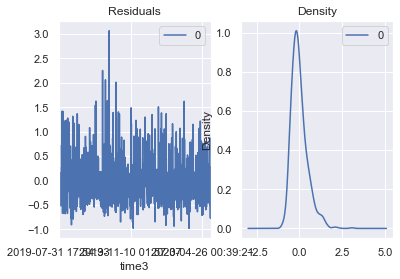

In [64]:
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:218: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


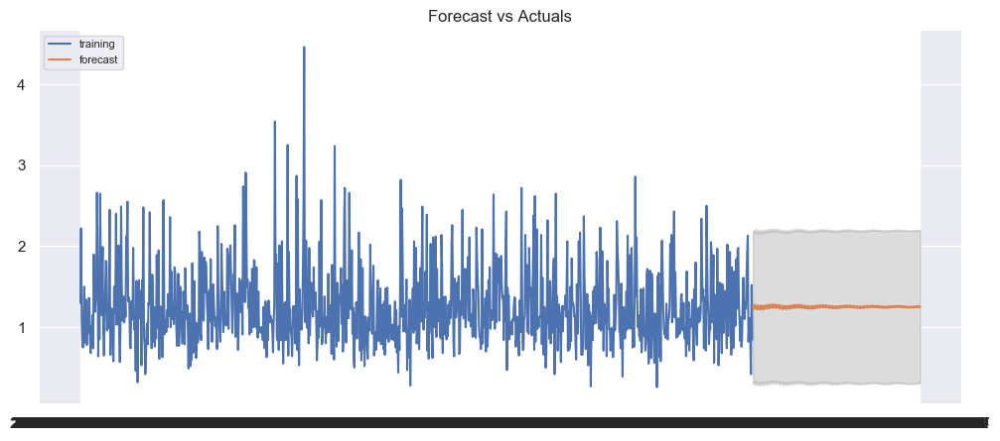

In [65]:
# Build Model
# model = ARIMA(train, order=(3,2,1))  
model = ARIMA(train, order=(5, 0, 5))  
fitted = model.fit(disp=-1)  

# Forecast
fc, se, conf = fitted.forecast(264, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train, label='training')
# plt.plot(test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

## Experimentation with rolling windows forecasting

In [66]:
fig= plt.figure(figsize=(250,70))
rolling_mean = train[-1000:].rolling(window = 3).mean()
rolling_std = train[-1000:].rolling(window = 3).std()
plt.plot(train[7000:], color = 'blue', label = 'Original', linewidth=12)
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean', linewidth=12)
plt.plot(rolling_std, color = 'black', label = 'Rolling Std', linewidth=12)
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.show()

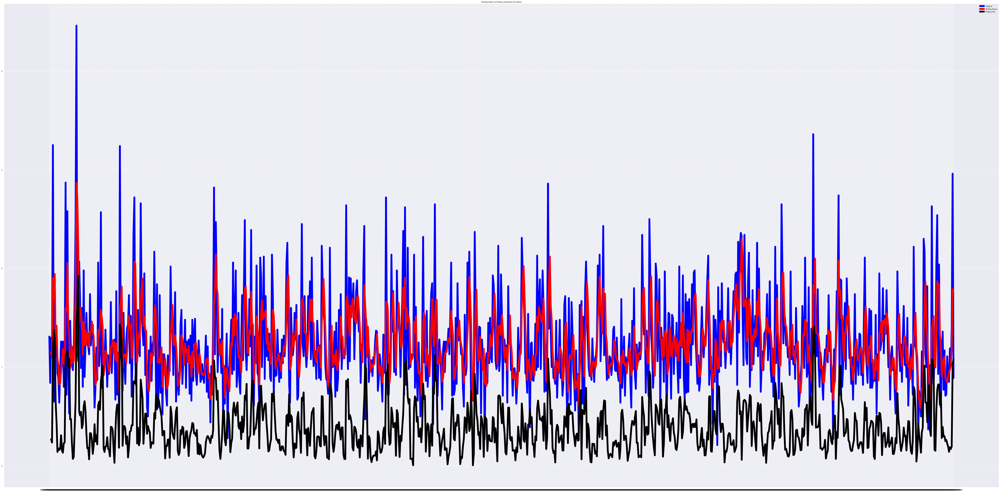

In [67]:
fig= plt.figure(figsize=(100,50))
rolling_mean = work_results['mag'][-1000:].rolling(window = 3).mean()
rolling_std = work_results['mag'][-1000:].rolling(window = 3).std()
plt.plot(results['mag'][-1000:], color = 'blue', label = 'Original', linewidth=10)
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean', linewidth=10)
plt.plot(rolling_std, color = 'black', label = 'Rolling Std', linewidth=10)
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.show()

In [ ]:
# rolling_mean.dropna()

In [68]:
from pmdarima.metrics import smape
print(f"SMAPE: {smape(rolling_mean.dropna()[0:264], test[-1000:])}")

SMAPE: 32.12421022269389


In [69]:
#this is the MAE (mean absolue error)
abs(rolling_mean-(test[-995:])).mean()

0.28868686868686844

In [70]:
#this is the RMSE
(abs(rolling_mean.dropna()-(test[-995:])).mean())**.5

0.53729588560389

/Users/jeffreyng/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:218: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


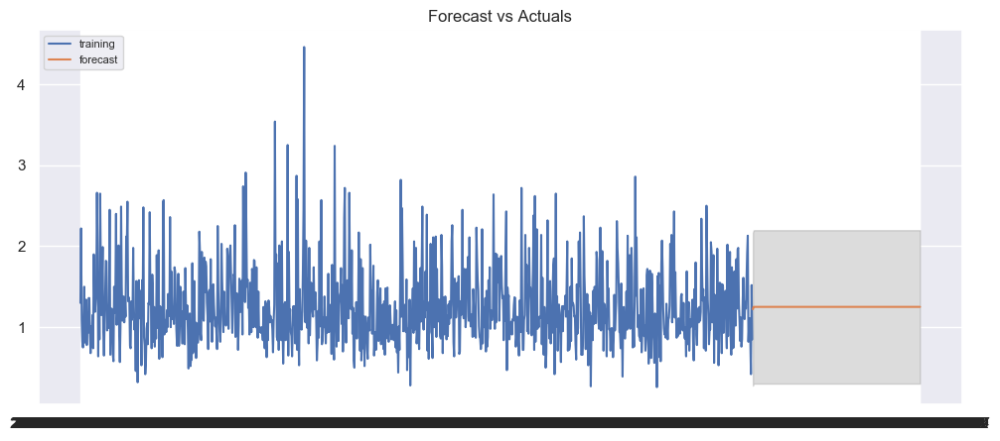

In [71]:
# Build Model
# model = ARIMA(train, order=(1,0,0))  
model = ARIMA(train, order=(1, 0, 0))  
fitted = model.fit(disp=-1)  

# Forecast
fc, se, conf = fitted.forecast(264, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train, label='training')
# plt.plot(test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

In [74]:
import pmdarima as pm

In [75]:
# pip install pmdarima

In [76]:
auto = pm.auto_arima(train, d=0, seasonal=False, stepwise=True,
                     suppress_warnings=True, error_action="ignore", max_p=6,
                     max_order=None, trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=1.87 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3625.745, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2059.973, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2948.312, Time=0.05 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=1828.353, Time=0.07 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=1734.124, Time=0.12 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=1686.935, Time=0.13 sec
 ARIMA(5,0,0)(0,0,0)[0]             : AIC=1649.211, Time=0.13 sec
 ARIMA(6,0,0)(0,0,0)[0]             : AIC=inf, Time=0.14 sec
 ARIMA(5,0,1)(0,0,0)[0]             : AIC=inf, Time=1.11 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=inf, Time=0.86 sec
 ARIMA(6,0,1)(0,0,0)[0]             : AIC=inf, Time=1.37 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=1471.830, Time=0.50 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=1469.911, Time=0.52 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1468.047, Time=0

In [77]:
from sklearn.metrics import mean_squared_error
from pmdarima.metrics import smape

model = auto  # seeded from the model we've already fit

def forecast_one_step():
    fc, conf_int = model.predict(n_periods=1, return_conf_int=True)
    return (
        fc.tolist()[0],
        np.asarray(conf_int).tolist()[0])

forecasts = []
confidence_intervals = []

for new_ob in test:
    fc, conf = forecast_one_step()
    forecasts.append(fc)
    confidence_intervals.append(conf)

    # Updates the existing model with a small number of MLE steps
#     model.update(new_ob)

print(f"Mean squared error: {mean_squared_error(test, forecasts)}")
print(f"SMAPE: {smape(test, forecasts)}")
# Mean squared error: 0.34238951346274243
# SMAPE: 0.9825490519101439
RMSE= np.sqrt( np.mean(test-forecasts)**2)
RMSE

Mean squared error: 0.24196117683694807
SMAPE: 28.9963934723018


0.03631558157385369

In [81]:
work_results.reset_index(inplace=True)

In [83]:
# fig, axes = plt.subplots(2, 1, figsize=(65, 30))

# # --------------------- Actual vs. Predicted --------------------------
# axes[1].plot(train, color='blue', label='Training Data')
# axes[1].plot(test.index, forecasts, color='green', marker='o',
#              label='Predicted mag')

# axes[1].plot(test.index, test, color='red', label='Actual')
# axes[1].set_title('ARIMA Model', fontsize=20)
# # axes[0].set_xlabel('Dates')
# axes[1].set_ylabel('Magnitude')
# plt.xlabel('Date', fontsize=70)
# plt.ylabel('Magnitude', fontsize=70)
# axes[1].set_xticks(np.arange(0, 7982, 1300).tolist(), work_results['time3'][0:7982:1300].tolist())

# axes[1].legend()
# plt.savefig('GoodArima.png')


# ------------------ Predicted with confidence intervals ----------------
# axes[1].plot(train, color='blue', label='Training Data')
# axes[1].plot(test.index, forecasts, color='green',
#              label='Predicted Price')

# axes[1].set_title('Prices Predictions & Confidence Intervals')
# axes[1].set_xlabel('Dates')
# axes[1].set_ylabel('Prices')

# conf_int = np.asarray(confidence_intervals)
# axes[1].fill_between(test.index,
#                      conf_int[:, 0], conf_int[:, 1],
#                      alpha=0.9, color='orange',
#                      label="Confidence Intervals")

# axes[1].set_xticks(np.arange(0, 7982, 1300).tolist(), df['Date'][0:7982:1300].tolist())
# axes[1].legend()

#### ARIMA Model RMSE=.0363, SMAPE=28.9

## LSTM Model 

In [88]:
from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler, StandardScaler

In [89]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [90]:
work_results.set_index('time3')

,index,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst,no_noise_mag
time3,,,,,,,,,,,,,,
2019-07-31 17:54:33,0,37.318500,-122.098667,-0.26,1.30,6.0,153.0,0.016070,0.03,0.84,31.61,0.500,7.0,0.008914
2019-08-01 01:24:16,1,38.375000,-122.417833,10.48,2.22,77.0,46.0,0.043570,0.11,0.17,0.27,0.181,50.0,0.911086
2019-08-01 13:28:31,2,37.381500,-122.247000,6.03,1.10,18.0,95.0,0.023160,0.07,0.22,0.33,0.194,13.0,0.208914
2019-08-01 23:08:34,3,37.481667,-121.640333,4.39,0.82,10.0,82.0,0.010870,0.05,0.26,0.38,0.179,10.0,0.488914
2019-08-02 05:47:56,4,37.407667,-121.681000,8.39,0.75,11.0,67.0,0.072670,0.05,0.26,0.85,0.312,11.0,0.558914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-30 02:51:28,1317,37.547167,-121.932500,5.54,1.19,32.0,61.0,0.007144,0.09,0.22,0.16,0.209,22.0,0.118914
2020-07-30 02:57:49,1318,37.485167,-121.800667,8.06,1.01,24.0,72.0,0.034760,0.05,0.23,0.40,0.184,21.0,0.298914
2020-07-31 19:45:52,1319,38.124500,-122.182000,-0.02,1.40,16.0,80.0,0.025910,0.13,0.31,31.61,0.403,15.0,0.091086


In [91]:
scaler = RobustScaler()
scaled_data = scaler.fit_transform(work_results[['mag']])
data= work_results.filter(['mag'])
dataset=data.values

In [92]:
dataset.shape

(1322, 1)

In [ ]:
scaled_data

In [93]:
training_data_len = math.ceil(len(dataset)*.8)
training_data_len

1058

In [ ]:
#Scale the data
# scaler = StandardScaler()
# scaled_data = scaler.fit_transform(dataset)


In [94]:
train_data= scaled_data[0:training_data_len , :]
#split data into x, y train


In [95]:
x_train=[]
y_train=[]

for i in range(60, len(train_data)):
    x_train.append(train_data[i-60:i, 0])
    y_train.append(train_data[i, 0])

In [96]:
x_train=np.array(x_train) 
y_train=np.array(y_train)

In [97]:
# Reshape the data
x_train= np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
x_train.shape

(998, 60, 1)

In [ ]:
model=Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(x_train.shape[1], 1)))
model.add(LSTM(100, return_sequences=True, input_shape=(x_train.shape[1], 1)))
model.add(LSTM(100, return_sequences=False))
model.add(Dense(35))
model.add(Dense(1))

In [ ]:
#Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

In [ ]:
model.fit(x_train, y_train, batch_size=130, epochs=7000)

In [ ]:
scaled_data.shape

In [98]:
test_data= scaled_data[training_data_len-60: , :]
#Create teh data sets x_test and y_test
x_test=[]
y_test=dataset[training_data_len: ,:]

for i in range(60, len(test_data)):
    x_test.append(test_data[i-60:i, 0])

In [99]:
#Convert data into np.array
x_test = np.array(x_test)

In [100]:
#Reshape the data for keras
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1] , 1))

In [101]:
x_test

array([[[ 0.46296296],
        [ 0.22222222],
        [ 0.12962963],
        ...,
        [-1.35185185],
        [ 0.68518519],
        [-0.55555556]],

       [[ 0.22222222],
        [ 0.12962963],
        [-0.55555556],
        ...,
        [ 0.68518519],
        [-0.55555556],
        [ 0.61111111]],

       [[ 0.12962963],
        [-0.55555556],
        [ 1.51851852],
        ...,
        [-0.55555556],
        [ 0.61111111],
        [ 0.2037037 ]],

       ...,

       [[ 1.51851852],
        [ 0.53703704],
        [ 0.11111111],
        ...,
        [-0.55555556],
        [ 0.07407407],
        [-0.25925926]],

       [[ 0.53703704],
        [ 0.11111111],
        [-0.35185185],
        ...,
        [ 0.07407407],
        [-0.25925926],
        [ 0.46296296]],

       [[ 0.11111111],
        [-0.35185185],
        [ 0.14814815],
        ...,
        [-0.25925926],
        [ 0.46296296],
        [ 3.35185185]]])

In [102]:
#predicted magnitudes to see if there is a looming notable earthquake
predictions=model.predict(x_test)
predictions= scaler.inverse_transform(predictions)

TypeError: n_periods must be an int

In [103]:
#Get the RMSE
#Get the SMAPE
RMSE= np.sqrt( np.mean(predictions- y_test)**2)
RMSE


Exception: Data must be 1-dimensional

In [ ]:
len(y_test)

In [ ]:
print(f"SMAPE: {smape(y_test[0], predictions[0])}")

In [ ]:
#Plot 
train= data[:training_data_len]
valid= data[training_data_len: ]
valid['predictions']=predictions
plt.figure(figsize=(100,30))
plt.title('LSTM Prediction vs Actual', fontsize=100)
plt.xlabel('Date', fontsize=100)
plt.ylabel('Magnitude', fontsize=100)
# plt.plot(train['mag'][12000: ])
plt.xticks(fontsize=75)
plt.yticks(fontsize=75)
plt.plot(valid[['mag', 'predictions']], linewidth=8.5)
plt.legend(['Valid', 'Predictions'], loc= 'lower right', fontsize=70)
plt.show()
fig.savefig('LSTM1.png', bbox_inches='tight');

#### LSTM Model RMSE= .047, SMAPE= 13.80

## Baseline Model

In [84]:
from numpy import random

x_baseline = random.randint(4, size=(14116))
x_baseline=tuple(x_baseline)
type(x_baseline)

tuple

In [105]:
work_results.reset_index(inplace=True)
v= list(work_results['time3'][-300:])

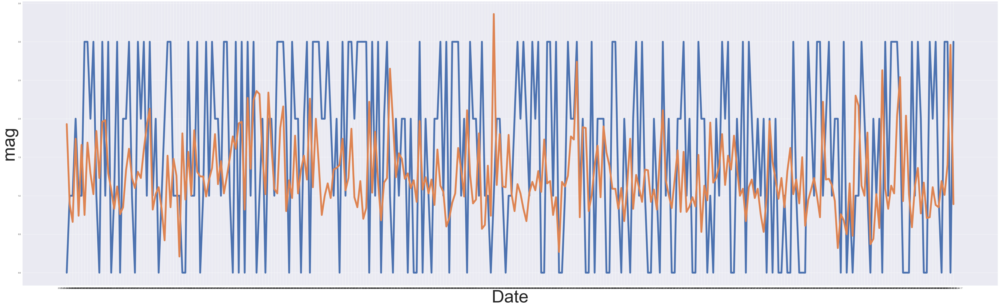

In [107]:
plt.figure(figsize=(100,30))
sns.lineplot(x=v,  y = x_baseline[-300:] , linewidth=10.5)
plt.ylabel('Magnitude', fontsize=100)
plt.xlabel('Date', fontsize=100)
sns.lineplot(x=v, y=work_results['mag'][-300:], linewidth=10.5)
plt.show()
fig.savefig('persistence.png');

In [87]:
RMSE= np.sqrt( np.mean(x_baseline- y_test)**2)
RMSE

NameError: name 'y_test' is not defined

In [ ]:
print(f"SMAPE: {smape(y_test[0], x_baseline)}")

### Baseline Model RMSE=1.23, SMAPE=89.76

## SARIMAX model

In [ ]:
dataset=work_results['mag']
y=work_results['mag']

In [ ]:
train_size=int(len(dataset) *0.8)
test_size = int(len(dataset)) - train_size

X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

In [ ]:
import statsmodels.api as sm

In [ ]:
seas_d=sm.tsa.seasonal_decompose(work_results['mag'], period=365);
fig=seas_d.plot()
fig.set_figheight(4)
plt.show()


In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
fig=sm.tsa.graphics.plot_acf(y_test, lags=50)
fig=sm.tsa.graphics.plot_pacf(y_test, lags=50)
plt.show()

In [ ]:
y_train

In [ ]:
from pmdarima.arima import auto_arima
model=auto_arima(y_train, exogenous= work_results[['depth']][-1057:], start_p=1, start_q=1, 
 max_p=6, max_q=6, 
 d=0,
 trace=True,
 trend='c',
 suppress_warnings=True, 
 stepwise=True)

In [ ]:
model.summary()

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
model= SARIMAX(y_train, 
 exog=work_results[['depth']][:1057],
 order=(1,0,0),
 enforce_invertibility=False, enforce_stationarity=False)

In [ ]:
sarimax=model.fit()

In [ ]:
predictions= sarimax.predict(start =train_size, end=train_size+test_size,exog=work_results[['depth']][-266:])

In [ ]:
predictions=pd.DataFrame(predictions)

In [ ]:
predictions
predictions['Actual'] = results['mag'][-266:]

In [ ]:
predictions['Actual']

In [ ]:
predictions['Actual'].plot(legend=True, color='red', figsize=(20,8))
predictions[0].plot(figsize=(20,8), legend=True, color='blue')


#### SARIMAX model RMSE=.441, SMAPE=42.55

In [ ]:
print(smape(predictions[0], work_results['mag'][-266:]))
RMSE= np.sqrt( np.mean(predictions[0]- work_results['mag'][-266:])**2)
RMSE

# print(mean_squared_error(predictions[0], predictions['Actual']))

## SARIMA Model

In [ ]:
dataset=work_results['mag']
y=work_results['mag']

In [ ]:
train_size=int(len(dataset) *0.8)
test_size = int(len(dataset)) - train_size

X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

In [ ]:
seas_d=sm.tsa.seasonal_decompose(work_results['mag'], period=365);
fig=seas_d.plot()
fig.set_figheight(4)
plt.show()

In [ ]:
from pmdarima.arima import auto_arima
sarima=auto_arima(y_train, start_p=1, start_q=1, 
 max_p=6, max_q=6, 
 d=0,
 trace=True,
 trend='c',
method='cg',
 suppress_warnings=True, 
 stepwise=True)

In [ ]:
sarima.summary()

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
sarima= SARIMAX(y_train, 
 exog=work_results[['depth']][:1057],
 order=(0,0,1),
 enforce_invertibility=False, enforce_stationarity=False)

In [ ]:
sarima=model.fit()

In [ ]:
predictions= sarima.predict(start =train_size, end=train_size+test_size,exog=work_results[['depth']][-266:])

In [ ]:
predictions=pd.DataFrame(predictions)

In [ ]:
predictions
predictions['Actual'] = work_results['mag'][-266:]

In [ ]:
predictions['Actual'].plot(legend=True, color='red', figsize=(20,8))
predictions[0].plot(figsize=(20,8), legend=True, color='blue')

In [ ]:
print(smape(predictions[0], work_results['mag'][-266:]))
RMSE= np.sqrt( np.mean(predictions[0]- results['mag'][-266:])**2)
RMSE

### RMSE= 1.039, SMAPE= 140.31